In [64]:
%pwd
%matplotlib inline

# Import necessary libraries
# neccasary packages are loaded
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from pathlib import Path
from IPython.display import display, Markdown
from ast import literal_eval
from wordcloud import WordCloud

import os

from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import TfidfVectorizer

from keras_preprocessing.text import Tokenizer
from keras_preprocessing.sequence import pad_sequences

from keras.models import Sequential
from keras.layers import Embedding, LSTM, Dense

import pickle

from evidently import ColumnMapping
from evidently.report import Report
from evidently.metrics import ColumnDriftMetric, DatasetDriftMetric, DatasetMissingValuesMetric
from evidently.metric_preset import DataDriftPreset, DataQualityPreset


## Introductory words about the dataset

The RecipeNLG dataset (Poznań University of Technology) is an expansion of the Recipe1M+ dataset, offering a significantly larger selection of recipes. Unlike its predecessor, this dataset does not prioritize linking cooking instructions with their corresponding images and instead emphasizes the recipe text, structure, and logic. This updated collection contains over one million newly preprocessed and deduplicated recipes, making it the largest publicly accessible dataset in its field.

The dataset is availabe on Kaggle <https://www.kaggle.com/datasets/saldenisov/recipenlg>.

## Dataset Cleaning & Processing


In [65]:
# dataset_path = 'dataset_full/dataset_recipes.csv'
# print(dataset_path)

# df_original = pd.read_csv(dataset_path)
# df_original_old = df_original[:]

In [66]:
MAX_INGREDIENTS_PER_COMBINATIONS = 5
EMBEDDING_OUT_DIM = 300
LSTM_UNITS = 128
WRITE_TOKENIZER_AS_MLFLOW_ARTIFACT = True

In [67]:
os.chdir('../dataset/')
path_base_dataset = os.getcwd()
print(path_base_dataset)

os.chdir('../artifacts/')
path_base_artifacts = os.getcwd()
print(path_base_artifacts)

os.chdir('../results/')
path_base_results = os.getcwd()
print(path_base_results)

os.chdir('../monitoring/')
path_base_monitoring = os.getcwd()
print(path_base_monitoring)


c:\Batool_Data (2024)\Privat\BT_Related to Durham College\Semester #2\github\Personalized_Recipe_Recommender\dataset
c:\Batool_Data (2024)\Privat\BT_Related to Durham College\Semester #2\github\Personalized_Recipe_Recommender\artifacts
c:\Batool_Data (2024)\Privat\BT_Related to Durham College\Semester #2\github\Personalized_Recipe_Recommender\results
c:\Batool_Data (2024)\Privat\BT_Related to Durham College\Semester #2\github\Personalized_Recipe_Recommender\monitoring


In [68]:
NUM_DATA_SAMPLES = 50000
NUM_INGREDIENTS_COMBINATIONS = 10000

file_name_sampled_data = '/sampled_dataset_' + str(NUM_DATA_SAMPLES) + '.csv'
sampled_data_file_path = path_base_dataset + file_name_sampled_data

file_name_simulated_data = '/simulated_user_input_' + str(NUM_INGREDIENTS_COMBINATIONS) + '.csv'
simulated_data_file_path = path_base_dataset + file_name_simulated_data


In [69]:
df = pd.read_csv(sampled_data_file_path)
df.head()


,Unnamed: 0,ID,name,ingredients,procedure,link,source,NER
0,1254789,1254789,"Bacon, Lettuce, Tomato And Fried Egg Sandwiches","[""4 slices bacon, halved"", ""4 None eggs"", ""4 N...","[""Lightly coat a nonstick frying pan and place...",recipes-plus.com/api/v2.0/recipes/37658,Gathered,"[""bacon"", ""eggs"", ""buns"", ""tomatoes"", ""mayonna..."
1,2162678,2162678,Sauteed Bay Scallops Recipe,"[""2 pound bay scallops"", ""1/4 pound butter, me...","[""Saute/fry onions and parsley in butter."", ""R...",cookeatshare.com/recipes/sauteed-bay-scallops-...,Recipes1M,"[""bay scallops"", ""butter"", ""onions"", ""parsley""..."
2,832049,832049,No Fuss No Mess Chicken And Rice,"[""1 c. uncooked rice"", ""1 chicken, cut up"", ""1...","[""Place rice in oblong pan."", ""Place chicken o...",www.cookbooks.com/Recipe-Details.aspx?id=334186,Gathered,"[""rice"", ""chicken"", ""cream of mushroom soup"", ..."
3,1396186,1396186,Baked Chicken Shawarma,"[""2 teaspoons coriander"", ""1 teaspoon allspice...","[""In a large bowl combine coriander, allspice,...",food52.com/recipes/41562-baked-chicken-shawarma,Gathered,"[""coriander"", ""allspice"", ""cumin"", ""ground gin..."
4,1322877,1322877,Salt-And-Pepper Biscuits,"[""3/4 cup sour cream"", ""4 tablespoons heavy cr...","[""Preheat oven to 425\u00b0F. Whisk sour cream...",www.epicurious.com/recipes/food/views/salt-and...,Gathered,"[""sour cream"", ""heavy cream"", ""baking powder"",..."


### List of Columns

In [70]:
df.columns

Index(['Unnamed: 0', 'ID', 'name', 'ingredients', 'procedure', 'link',
       'source', 'NER'],
      dtype='object')

The dataset consists of 7 columns:
- id (int): ID.
- title (str): Title of the recipe.
- ingredients (list of str): Ingredients.
- directions (list of str): Instruction steps.
- link (str): URL link.
- source (ClassLabel): Origin of each recipe record, with possible value {"Gathered", "Recipes1M"}:
    1. "Gathered" (0): Additional recipes gathered from multiple cooking web pages using automated scripts in a web scraping process.
    2. "Recipes1M" (1): Recipes from the "Recipe1M+" dataset.

## Data Preparation

In [71]:
df.head()

,Unnamed: 0,ID,name,ingredients,procedure,link,source,NER
0,1254789,1254789,"Bacon, Lettuce, Tomato And Fried Egg Sandwiches","[""4 slices bacon, halved"", ""4 None eggs"", ""4 N...","[""Lightly coat a nonstick frying pan and place...",recipes-plus.com/api/v2.0/recipes/37658,Gathered,"[""bacon"", ""eggs"", ""buns"", ""tomatoes"", ""mayonna..."
1,2162678,2162678,Sauteed Bay Scallops Recipe,"[""2 pound bay scallops"", ""1/4 pound butter, me...","[""Saute/fry onions and parsley in butter."", ""R...",cookeatshare.com/recipes/sauteed-bay-scallops-...,Recipes1M,"[""bay scallops"", ""butter"", ""onions"", ""parsley""..."
2,832049,832049,No Fuss No Mess Chicken And Rice,"[""1 c. uncooked rice"", ""1 chicken, cut up"", ""1...","[""Place rice in oblong pan."", ""Place chicken o...",www.cookbooks.com/Recipe-Details.aspx?id=334186,Gathered,"[""rice"", ""chicken"", ""cream of mushroom soup"", ..."
3,1396186,1396186,Baked Chicken Shawarma,"[""2 teaspoons coriander"", ""1 teaspoon allspice...","[""In a large bowl combine coriander, allspice,...",food52.com/recipes/41562-baked-chicken-shawarma,Gathered,"[""coriander"", ""allspice"", ""cumin"", ""ground gin..."
4,1322877,1322877,Salt-And-Pepper Biscuits,"[""3/4 cup sour cream"", ""4 tablespoons heavy cr...","[""Preheat oven to 425\u00b0F. Whisk sour cream...",www.epicurious.com/recipes/food/views/salt-and...,Gathered,"[""sour cream"", ""heavy cream"", ""baking powder"",..."


In [72]:
# df.to_csv(sampled_data_file_path)
df = df.drop('Unnamed: 0', axis=1)
df.head()

,ID,name,ingredients,procedure,link,source,NER
0,1254789,"Bacon, Lettuce, Tomato And Fried Egg Sandwiches","[""4 slices bacon, halved"", ""4 None eggs"", ""4 N...","[""Lightly coat a nonstick frying pan and place...",recipes-plus.com/api/v2.0/recipes/37658,Gathered,"[""bacon"", ""eggs"", ""buns"", ""tomatoes"", ""mayonna..."
1,2162678,Sauteed Bay Scallops Recipe,"[""2 pound bay scallops"", ""1/4 pound butter, me...","[""Saute/fry onions and parsley in butter."", ""R...",cookeatshare.com/recipes/sauteed-bay-scallops-...,Recipes1M,"[""bay scallops"", ""butter"", ""onions"", ""parsley""..."
2,832049,No Fuss No Mess Chicken And Rice,"[""1 c. uncooked rice"", ""1 chicken, cut up"", ""1...","[""Place rice in oblong pan."", ""Place chicken o...",www.cookbooks.com/Recipe-Details.aspx?id=334186,Gathered,"[""rice"", ""chicken"", ""cream of mushroom soup"", ..."
3,1396186,Baked Chicken Shawarma,"[""2 teaspoons coriander"", ""1 teaspoon allspice...","[""In a large bowl combine coriander, allspice,...",food52.com/recipes/41562-baked-chicken-shawarma,Gathered,"[""coriander"", ""allspice"", ""cumin"", ""ground gin..."
4,1322877,Salt-And-Pepper Biscuits,"[""3/4 cup sour cream"", ""4 tablespoons heavy cr...","[""Preheat oven to 425\u00b0F. Whisk sour cream...",www.epicurious.com/recipes/food/views/salt-and...,Gathered,"[""sour cream"", ""heavy cream"", ""baking powder"",..."


### Setting the types

In [73]:
df = df.astype({'ID': int, 
                'name': str,
                'ingredients': 'object', 
                'procedure': 'object', 
                'link': str,
                'source': 'category', 
                'NER': 'object'})

### Adding Extra Columns
The variations in ingredients and their quantities across recipes, as well as the number of steps in each recipe, are of interest.


In [74]:
df['n_NER'] = df['NER'].apply(len)
df['n_procedures'] = df['procedure'].apply(len)

In [75]:
df.head()

,ID,name,ingredients,procedure,link,source,NER,n_NER,n_procedures
0,1254789,"Bacon, Lettuce, Tomato And Fried Egg Sandwiches","[""4 slices bacon, halved"", ""4 None eggs"", ""4 N...","[""Lightly coat a nonstick frying pan and place...",recipes-plus.com/api/v2.0/recipes/37658,Gathered,"[""bacon"", ""eggs"", ""buns"", ""tomatoes"", ""mayonna...",51,335
1,2162678,Sauteed Bay Scallops Recipe,"[""2 pound bay scallops"", ""1/4 pound butter, me...","[""Saute/fry onions and parsley in butter."", ""R...",cookeatshare.com/recipes/sauteed-bay-scallops-...,Recipes1M,"[""bay scallops"", ""butter"", ""onions"", ""parsley""...",73,380
2,832049,No Fuss No Mess Chicken And Rice,"[""1 c. uncooked rice"", ""1 chicken, cut up"", ""1...","[""Place rice in oblong pan."", ""Place chicken o...",www.cookbooks.com/Recipe-Details.aspx?id=334186,Gathered,"[""rice"", ""chicken"", ""cream of mushroom soup"", ...",93,166
3,1396186,Baked Chicken Shawarma,"[""2 teaspoons coriander"", ""1 teaspoon allspice...","[""In a large bowl combine coriander, allspice,...",food52.com/recipes/41562-baked-chicken-shawarma,Gathered,"[""coriander"", ""allspice"", ""cumin"", ""ground gin...",219,860
4,1322877,Salt-And-Pepper Biscuits,"[""3/4 cup sour cream"", ""4 tablespoons heavy cr...","[""Preheat oven to 425\u00b0F. Whisk sour cream...",www.epicurious.com/recipes/food/views/salt-and...,Gathered,"[""sour cream"", ""heavy cream"", ""baking powder"",...",130,936


### Cleaning Empty
First lets copy the df

In [76]:
df_old = df[:]

#### Cleaning n_NER column

In [77]:
df = df[df['n_NER'] > 0]

#### Cleaning n_procedures column

In [78]:
df = df[df['n_procedures'] > 0]

Dataset Head:
         ID                                             name  \
0  1254789  Bacon, Lettuce, Tomato And Fried Egg Sandwiches   
1  2162678                      Sauteed Bay Scallops Recipe   
2   832049                 No Fuss No Mess Chicken And Rice   
3  1396186                           Baked Chicken Shawarma   
4  1322877                        Salt-And-Pepper Biscuits    

                                         ingredients  \
0  ["4 slices bacon, halved", "4 None eggs", "4 N...   
1  ["2 pound bay scallops", "1/4 pound butter, me...   
2  ["1 c. uncooked rice", "1 chicken, cut up", "1...   
3  ["2 teaspoons coriander", "1 teaspoon allspice...   
4  ["3/4 cup sour cream", "4 tablespoons heavy cr...   

                                           procedure  \
0  ["Lightly coat a nonstick frying pan and place...   
1  ["Saute/fry onions and parsley in butter.", "R...   
2  ["Place rice in oblong pan.", "Place chicken o...   
3  ["In a large bowl combine coriander, allsp

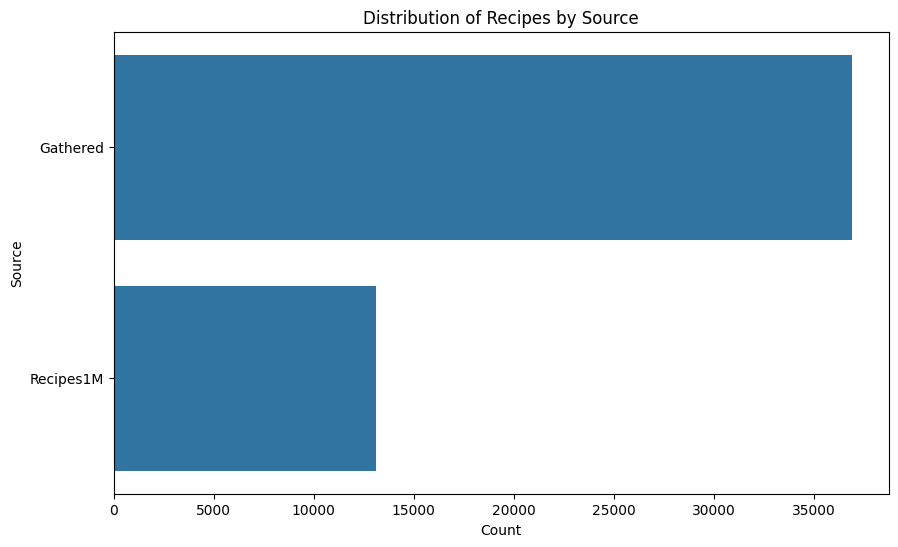

In [79]:
# Display the first few rows of the dataset
print("Dataset Head:\n", df.head())

# Display basic information about the dataset
print("\nDataset Info:\n")
df.info()

# Display summary statistics of the dataset
print("\nDataset Description:\n", df.describe())

# Check for missing values
print("\nMissing Values:\n", df.isnull().sum())

# Check for duplicates
print("\nDuplicate Rows:\n", df.duplicated().sum())

# Visualize distribution of recipes
plt.figure(figsize=(10, 6))
sns.countplot(y=df['source'])
plt.title('Distribution of Recipes by Source')
plt.xlabel('Count')
plt.ylabel('Source')
plt.show()


In [80]:
# Remove duplicate rows
df = df.drop_duplicates()

# Handling missing values
# For simplicity, we will drop rows with missing values. 
# Depending on the data, you may choose to impute missing values.
df = df.dropna()

# Verify that there are no more missing values or duplicates
print("\nMissing Values After Cleaning:\n", df.isnull().sum())
print("\nDuplicate Rows After Cleaning:\n", df.duplicated().sum())



Missing Values After Cleaning:
 ID              0
name            0
ingredients     0
procedure       0
link            0
source          0
NER             0
n_NER           0
n_procedures    0
dtype: int64

Duplicate Rows After Cleaning:
 0


## Data Analysis

### Unique Values of Sources

In [81]:
df['source'].unique()

['Gathered', 'Recipes1M']
Categories (2, object): ['Gathered', 'Recipes1M']

### Unique Values of Recipes

In [82]:
unique_names = len(df['name'].unique())
number_entries = len(df)
number_entries_old = len(df_old)
display(Markdown(f'Number of all entries: {number_entries:.0f} vs Number of all entries before cleaning: {number_entries_old :.0f}'))
display(Markdown(f'Number of unique names: {unique_names :.0f}'))

Number of all entries: 50000 vs Number of all entries before cleaning: 50000

Number of unique names: 41296

### Distribution of Number Ingredients by Sources

C:\Users\batoo\AppData\Local\Temp\ipykernel_6128\809033254.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  average_n_ingridients = df.groupby('source')['n_NER'].mean()


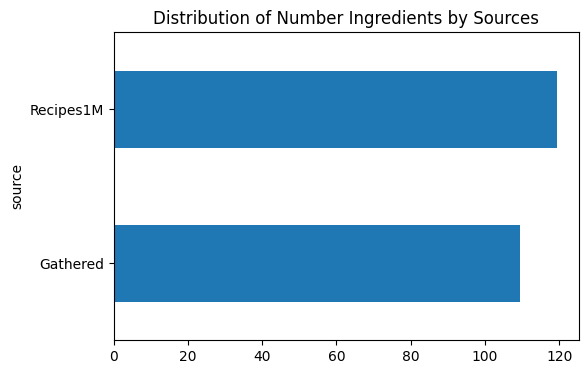

In [83]:
average_n_ingridients = df.groupby('source')['n_NER'].mean()
fig, ax = plt.subplots(figsize=(6, 4))
ax.set_title('Distribution of Number Ingredients by Sources')
average_n_ingridients.plot(kind='barh', stacked=False, ax=ax)
# Show the chart
plt.show()

### Distribution of Number Procedure Steps by Sources

C:\Users\batoo\AppData\Local\Temp\ipykernel_6128\3374620337.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  average_n_procedures = df.groupby('source')['n_procedures'].mean()


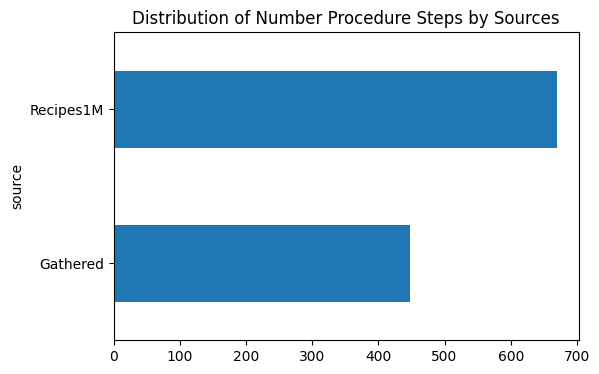

In [84]:
average_n_procedures = df.groupby('source')['n_procedures'].mean()
fig, ax = plt.subplots(figsize=(6, 4))
ax.set_title('Distribution of Number Procedure Steps by Sources')
average_n_procedures.plot(kind='barh', stacked=False, ax=ax)
# Show the chart
plt.show()

## Ingredients

### List of ingredients

In [85]:
NER_exploded = df.explode('NER')
print(f"NER_explode len {len(NER_exploded)}")

ingredients = NER_exploded['NER']
print(ingredients[0:10])

# get the unique values of the exploded column
unique_NER_values = NER_exploded['NER'].unique()
print(len(unique_NER_values))

NER_explode len 50000
0    ["bacon", "eggs", "buns", "tomatoes", "mayonna...
1    ["bay scallops", "butter", "onions", "parsley"...
2    ["rice", "chicken", "cream of mushroom soup", ...
3    ["coriander", "allspice", "cumin", "ground gin...
4    ["sour cream", "heavy cream", "baking powder",...
5    ["hamburger", "egg", "bread crumbs", "onion", ...
6    ["stew meat", "cabbage", "onion", "green bell ...
7    ["chicken broth", "water", "chicken", "onion",...
8    ["pork sparerib", "black bean sauce", "Chinese...
9    ["shell pasta", "red pepper", "green onion", "...
Name: NER, dtype: object
49799


In [86]:
display(Markdown(f'Number of unique ingridients: {len(unique_NER_values) :.0f}'))

Number of unique ingridients: 49799

In [87]:
print(unique_NER_values[:200])

['["bacon", "eggs", "buns", "tomatoes", "mayonnaise"]'
 '["bay scallops", "butter", "onions", "parsley", "lemons", "bread crumbs"]'
 '["rice", "chicken", "cream of mushroom soup", "cream of chicken soup", "onion soup", "water"]'
 '["coriander", "allspice", "cumin", "ground ginger", "turmeric", "cinnamon", "cayenne", "pepper", "salt", "lemon juice", "olive oil", "garlic", "chicken", "pita", "red onion", "parsley", "shredded red cabbage", "tahini"]'
 '["sour cream", "heavy cream", "baking powder", "kosher salt", "sugar", "ground black pepper", "flour", "butter", "salt", "cutter"]'
 '["hamburger", "egg", "bread crumbs", "onion", "milk", "salt", "pepper", "bacon", "catsup"]'
 '["stew meat", "cabbage", "onion", "green bell peppers", "oil", "tomatoes", "garlic", "soy sauce"]'
 '["chicken broth", "water", "chicken", "onion", "vegetables", "garlic", "salt", "fresh cilantro", "potatoes", "vegetable oil"]'
 '["pork sparerib", "black bean sauce", "Chinese rice wine", "cornstarch", "ginger", "garl

There is an issue with the data, as it contains inconsistent naming conventions. For instance, "apples" should be "apple", and different types of cheese should be grouped into a single "cheese" category.



### World Cloud of Ingredients

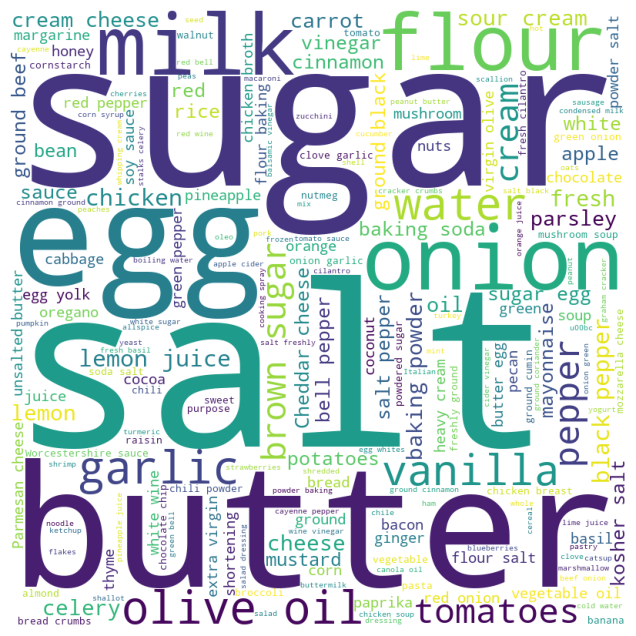

In [88]:
# Generate the word cloud
wordcloud = WordCloud(width=800, height=800, background_color='white').generate(' '.join(ingredients[:1000]))

# Display the word cloud using matplotlib
plt.figure(figsize=(8, 8))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

### World Cloud of Unique Ingredients

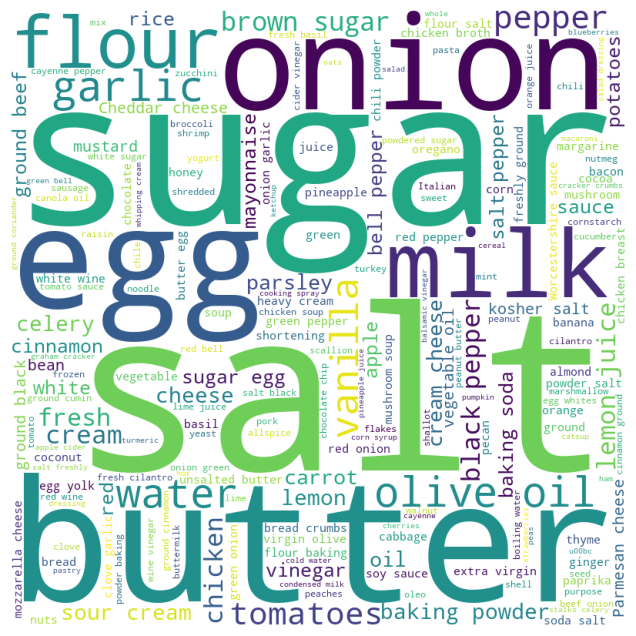

In [89]:
# Generate the word cloud
wordcloud = WordCloud(width=800, height=800, background_color='white').generate(' '.join(unique_NER_values[:1000]))

# Display the word cloud using matplotlib
plt.figure(figsize=(8, 8))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

### Procedures for NLP Models

- Tokenize ingredients
- Calculate TFIDF Vector
- Compute Similarity Scores
- ML Model Training

In [90]:
def read_csv_data(filename: str) -> pd.DataFrame:
    """   
    Read out the data from the specified CSV File
    This function is used to load the data sampled from a large dataset for training the model (X_train).
    The same function is used to load the simulated user responses that make the labels (y_train) for the model.

    Args:
        path (str): Path to the CSV file.

    Returns:
        pd.DataFrame: Loaded data as a DataFrame.
    """

    print("Loading data from %s", filename)
    
    df = pd.read_csv(filename)

    return df


In [91]:
# path_base_artifacts = '../artifacts/'

def tokenize_data(X_train: pd.DataFrame):
    
    print("Tokenizing the ingredients...")

    # Tokenizing only the ingredients
    tokenizer = Tokenizer()
    tokenizer.fit_on_texts(X_train['NER'])  # Use the NER column only. NER column contains the ingredients
    ingredient_sequences = tokenizer.texts_to_sequences(X_train['NER'])
    print(f"ingredient_sequences -> {ingredient_sequences[0:5]}")

    # Dimension calculation for the input parameter of embeddings
    print("Dimension calculation for the input parameter of embeddings")
    embeddings_input_dimension = len(tokenizer.word_index) + 1

    # Calculate the length of each ingredient list
    print("Calculate the length of each ingredient list")
    sequence_lengths = [len(seq) for seq in ingredient_sequences]

    # Set max_sequence_length to a suitable value, e.g., 90th percentile
    print("Set max_sequence_length to a suitable value, e.g., 90th percentile")
    max_sequence_length = int(np.percentile(sequence_lengths, 90))

    print("Padding the data as required to complete data preparation of X_train")
    ingredient_sequences_padded = pad_sequences(ingredient_sequences, maxlen=max_sequence_length)

    # Combine tokenizer and max_sequence_length into a dictionary
    print("Combine tokenizer and max_sequence_length into a dictionary")
    tokenizer_info_data = {
        'tokenizer': tokenizer,
        'max_sequence_length': max_sequence_length
    }

    # Save the tokenizer
    if not os.path.exists(path_base_artifacts):
        os.makedirs(path_base_artifacts)
    
    tokenizer_path = path_base_artifacts + '/tokenizer_info.pickle'
    # tokenizer_path = 'tokenizer.pickle'
    
    if not os.path.exists(tokenizer_path):
        with open(tokenizer_path, 'wb') as handle:
            pickle.dump(tokenizer_info_data, handle, protocol=pickle.HIGHEST_PROTOCOL)
    else:
        print(f"The file '{tokenizer_path}' already exists.")
    

    print(f"type of max_sequence_length {type(max_sequence_length)}")
    print(f"type of ingredient_sequences_padded {type(ingredient_sequences_padded)}")
    print(f"type of embeddings_input_dimension {type(embeddings_input_dimension)}")
    print(f"type of tokenizer_info_data {type(tokenizer_info_data)}")
    
    return max_sequence_length, ingredient_sequences_padded, embeddings_input_dimension, tokenizer_info_data


In [92]:
def compute_TFIDFVector(X_train: pd.DataFrame):
    print("TF-IDF vectorization of ingredients...")

    print("Fit a TF-IDF Vectorizer on the ingredients")
    tfidf = TfidfVectorizer()
    tfidf_matrix = tfidf.fit_transform(X_train['ingredients_str'])
    print(tfidf_matrix[0:5])

    # Print the shape of the TF-IDF matrix
    print("Print the shape of the TF-IDF matrix")
    print(f"tfidf_matrix.shape {tfidf_matrix.shape}")  # Output: (number of recipes, number of unique words)
    print(f"type of tfidf {type(tfidf)}")
    print(f"type of tfidf_matrix {type(tfidf_matrix)}")

    return tfidf, tfidf_matrix


In [93]:
def compute_similarity(user_input, tfidf, tfidf_matrix):
    print("Computation of similarity scores starts here...")

    user_input_tfidf = tfidf.transform([user_input])
    cosine_sim = cosine_similarity(user_input_tfidf, tfidf_matrix)
    print(f"type of cosine_sim.flatten {type(cosine_sim.flatten())}")

    return cosine_sim.flatten()


In [94]:
def add_features(X_train: pd.DataFrame) -> pd.DataFrame:

    print("Feature engineering...")

    # Convert the string representation of lists to actual lists
    print("Convert the string representation of lists to actual lists")
    # string representation of list to list using ast.literal_eval(); ast.literal_eval is imported as literal_eval
    X_train['ingredients_list'] = X_train['NER'].apply(literal_eval)
    print(f"ingredients_list -> {X_train['ingredients_list'].head(5)}")

    # Convert the ingredients to a single string for each recipe
    print("Convert the ingredients to a single string for each recipe")
    X_train['ingredients_str'] = X_train['ingredients_list'].apply(lambda x: ' '.join(x))
    print(f"ingredients_str -> {X_train['ingredients_str'].head(5)}")

    print(f"type of X_train {X_train}")
    
    return X_train


In [95]:
def preprocess_y_train(X_train: pd.DataFrame, for_y_train: pd.DataFrame):

    print("Preparing the target labels (y_train)...")

    tfidf, tfidf_matrix = compute_TFIDFVector(X_train)

    # Iterate over the loaded data to preprocess and compute similarity scores
    print("Iterate over the loaded data to preprocess and compute similarity scores")
    for index, row in for_y_train.iterrows():
        user_ingredients = row['user_input_simulated']
        user_ingredients_list = [ingredient.strip() for ingredient in user_ingredients.split(',')]
        user_ingredients_str = ' '.join(user_ingredients_list)
        print(user_ingredients_str)
        
        # Compute similarity scores
        similarity_scores = compute_similarity(user_ingredients_str, tfidf, tfidf_matrix)

        # Print the similarity scores
        print(similarity_scores)

        y_train = similarity_scores

        print(f"type of y_train {y_train}")
        
        return y_train


In [96]:
def preprocess_X_train(X_train: pd.DataFrame):

    print("Preparing the data for training (X_train)...")

    X_new_features = add_features(X_train)
    print(X_new_features.head())
    X_train = X_new_features[:]
    print(X_train.head())

    max_sequence_length, ingredient_sequences_padded, embeddings_input_dimension, tokenizer_info_data = tokenize_data(X_train)

    return X_train, ingredient_sequences_padded, max_sequence_length, embeddings_input_dimension, tokenizer_info_data


In [97]:
def model_experiment_tracking(X_train, 
                              y_train, 
                              MAX_SEQUENCE_LENGTH, 
                              EMBEDDING_IN_DIM, 
                              df_X_train):

    print("Model training, experiment tracking, and model registry...")

    df = df_X_train

    # LSTM Model Hyperparameters
    batch_size_list = [32] # default tested is batch_size=32
    activation_list = ['sigmoid'] # default tested is activation_func=sigmoid
    epochs_list = [10] # default tested is epochs=10
    optimizers_list = ['adam'] # default tested is optimizer=adam
    lstm_units_list = [128]

    for activation_func in activation_list:
        for batch_size in batch_size_list:
            for lstm in lstm_units_list:
                for epochs in epochs_list:
                    for optimizer in optimizers_list:
                           # Build the model
                            model = Sequential([
                                                Embedding(input_dim=EMBEDDING_IN_DIM, 
                                                        output_dim=EMBEDDING_OUT_DIM, 
                                                        input_length=MAX_SEQUENCE_LENGTH),
                                                LSTM(units=lstm, 
                                                    return_sequences=False),  # LSTM hidden layer
                                                Dense(1, activation=activation_func)  # Output layer
                            ])

                            # Compile the model
                            model.compile(optimizer=optimizer, 
                                        loss='mean_squared_error', 
                                        metrics=['mean_absolute_error'])

                            # Train the model
                            history = model.fit(X_train, #ingredient_sequences_padded, 
                                                y_train, #similarity_scores, 
                                                epochs=epochs, 
                                                batch_size=batch_size, 
                                                validation_split=0.2)

                            
                            # Evaluate the model
                            loss, mean_absolute_error = model.evaluate(X_train, y_train, verbose=1)

                            print(X_train)
                            # Make predictions and log them
                            predictions = model.predict(X_train)
                            print(f'Batch Size: {batch_size}, LSTM Units: {lstm}, Epochs: {epochs}, Optimizer: {optimizer}')
                            print(f'Loss: {loss}, Performace Metric: {mean_absolute_error}')
                            print('Predictions:')
                            print(predictions)
                            df['similarity_scores'] = predictions
                            print(df.head())

                            # convert array into dataframe 
                            pred_df = pd.DataFrame(predictions)
                            # path_base_results = 'results/' 
                            artifacts_file_name = '/recommendations_bs' + str(batch_size) + '_lstm' + str(lstm) + '_epochs' + str(epochs) + '_optimizer_' + optimizer + '.csv'
                            artifacts_file_name_and_path = path_base_results + artifacts_file_name
                            pred_df.to_csv(artifacts_file_name_and_path)
                            
                            labelled_source_data_file_name = '/labelled_data_bs' + str(batch_size) + '_lstm' + str(lstm) + '_epochs' + str(epochs) + '_optimizer_' + optimizer + '.csv' 
                            artifacts_file_name_and_path_labelled_data = path_base_results + labelled_source_data_file_name
                            df.to_csv(artifacts_file_name_and_path_labelled_data)
                            
    return model


In [98]:
# Load the data
df_X_train = read_csv_data(sampled_data_file_path)
df_y_train = read_csv_data(simulated_data_file_path)

# Prepare the training data
df_X_train, X_train, MAX_SEQUENCE_LENGTH, EMBEDDING_IN_DIM, tokenizer_info_data = preprocess_X_train(df_X_train)
y_train = preprocess_y_train(df_X_train, df_y_train)

# Train the model
model_original = model_experiment_tracking(X_train, 
                                           y_train, 
                                           MAX_SEQUENCE_LENGTH, 
                                           EMBEDDING_IN_DIM, 
                                           df_X_train)


Loading data from %s c:\Batool_Data (2024)\Privat\BT_Related to Durham College\Semester #2\github\Personalized_Recipe_Recommender\dataset/sampled_dataset_50000.csv
Loading data from %s c:\Batool_Data (2024)\Privat\BT_Related to Durham College\Semester #2\github\Personalized_Recipe_Recommender\dataset/simulated_user_input_10000.csv
Preparing the data for training (X_train)...
Feature engineering...
Convert the string representation of lists to actual lists
ingredients_list -> 0            [bacon, eggs, buns, tomatoes, mayonnaise]
1    [bay scallops, butter, onions, parsley, lemons...
2    [rice, chicken, cream of mushroom soup, cream ...
3    [coriander, allspice, cumin, ground ginger, tu...
4    [sour cream, heavy cream, baking powder, koshe...
Name: ingredients_list, dtype: object
Convert the ingredients to a single string for each recipe
ingredients_str -> 0                  bacon eggs buns tomatoes mayonnaise
1    bay scallops butter onions parsley lemons brea...
2    rice chicken c

c:\Users\batoo\anaconda3\envs\MLOps_LLM_Zoomcamp\Lib\site-packages\keras\src\layers\core\embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


Epoch 1/10
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 106s 80ms/step - loss: 0.0075 - mean_absolute_error: 0.0404 - val_loss: 1.3701e-04 - val_mean_absolute_error: 0.0080
Epoch 2/10
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 106s 84ms/step - loss: 1.2850e-04 - mean_absolute_error: 0.0072 - val_loss: 7.6316e-05 - val_mean_absolute_error: 0.0054
Epoch 3/10
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 106s 85ms/step - loss: 5.6377e-05 - mean_absolute_error: 0.0041 - val_loss: 5.8746e-05 - val_mean_absolute_error: 0.0037
Epoch 4/10
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 112s 90ms/step - loss: 4.6782e-05 - mean_absolute_error: 0.0036 - val_loss: 6.8977e-05 - val_mean_absolute_error: 0.0043
Epoch 5/10
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 126s 100ms/step - loss: 4.2829e-05 - mean_absolute_error: 0.0033 - val_loss: 5.5163e-05 - val_mean_absolute_error: 0.0032
Epoch 6/10
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 113s 90ms/step - loss: 3.8183e-05 - mean_absolute_error: 0.0029 - val_loss: 5.4665e-05 - val_mean_absolute_error: 0.0034
Epoch 7/10
1250/1250 ━━━━

### Dump model and reference data

In [99]:
# with open('models/lstm.bin', 'wb') as f_out:
#     dump(model_original, f_out)

with open('models/lstm.bin', 'wb') as handle:
    pickle.dump(model_original, handle, protocol=pickle.HIGHEST_PROTOCOL)

### Evidently Report

In [100]:
df_reference = pd.DataFrame()

# print(X_train.shape)
# print(y_train.shape)

# # creating columns 'X_train' and 'y_train'
# # using dataframe.assign() function
# df_reference = df_reference.assign(X_train=X_train.tolist(),
#                                    y_train=y_train.tolist())

# Convert X_train to a DataFrame with 21 columns 
df_X_train = pd.DataFrame(X_train, columns=[f"token_{i+1}" for i in range(X_train.shape[1])]) 

# Convert y_train to a DataFrame with a single column 
df_y_train = pd.DataFrame(y_train, columns=['similarity_score']) 

# Combine X_train and y_train into a single DataFrame 
df_reference = pd.concat([df_X_train, df_y_train], axis=1)
df_reference.head()

,token_1,token_2,token_3,token_4,token_5,token_6,token_7,token_8,token_9,token_10,...,token_13,token_14,token_15,token_16,token_17,token_18,token_19,token_20,token_21,similarity_score
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,72,14,322,30,59,0.000000
1,0,0,0,0,0,0,0,0,0,0,...,0,109,593,4,33,37,253,44,85,0.000000
2,0,0,0,0,0,0,0,0,45,16,...,93,40,8,49,16,40,9,40,13,0.023267
3,11,54,213,32,113,3,1,23,19,20,...,16,555,22,9,37,183,22,142,523,0.027031
4,0,0,0,0,0,42,8,95,8,21,...,1,2,11,29,3,7,4,1,1965,0.000000


In [101]:
X_train.shape[1]
df_X_train.shape

(50000, 21)

In [103]:
current_data = path_base_dataset + '/simulated_user_input_' + str(5000) + '.csv'
df_current = read_csv_data(current_data)

# Iterate over the loaded data to preprocess and using for predictions
print("Iterate over the loaded data to preprocess and compute similarity scores")
for index, row in df_current.iterrows():
    user_ingredients = row['user_input_simulated']
    user_ingredients_list = [ingredient.strip() for ingredient in user_ingredients.split(',')]
    user_ingredients_str = ' '.join(user_ingredients_list)
    print(user_ingredients_str)

tokenizer_path = path_base_artifacts + '/tokenizer_info.pickle'

# Load the pickle file
with open(tokenizer_path, 'rb') as handle:
    tokenizer_info_data = pickle.load(handle)

# Extract the tokenizer and max_sequence_length
tokenizer = tokenizer_info_data['tokenizer']
max_sequence_length = tokenizer_info_data['max_sequence_length']

print(f"max_sequence_length {max_sequence_length}")

# Tokenize and pad the user ingredients
user_sequences = tokenizer.texts_to_sequences(user_ingredients_str)
user_padded = pad_sequences(user_sequences, maxlen=max_sequence_length)
print(f"user_padded_sequence {user_padded}")

predictions = model_original.predict(user_padded)

df_current = pd.DataFrame()

# Convert X_train to a DataFrame with 21 columns 
df_X_train_current = pd.DataFrame(user_padded, columns=[f"token_{i+1}" for i in range(user_padded.shape[1])]) 

# Convert y_train to a DataFrame with a single column 
df_y_train_current = pd.DataFrame(predictions, columns=['similarity_score']) 

# Combine X_train and y_train into a single DataFrame 
df_current = pd.concat([df_X_train_current, df_y_train_current], axis=1)

df_current.head()

Loading data from %s c:\Batool_Data (2024)\Privat\BT_Related to Durham College\Semester #2\github\Personalized_Recipe_Recommender\dataset/simulated_user_input_5000.csv
Iterate over the loaded data to preprocess and compute similarity scores
["marshmallow cream" "oleo" "cocoa" "sugar" "vanilla" "flour" "eggs" "nuts"]
["pineapple" "breadcrumbs" "green onion" "sweet red pepper" "soy sauce" "salt" "lean ground turkey" "teriyaki sauce" "sesame hamburger"] ["fruity red wine" "sugar" "cinnamon"] ["egg yolks" "sugar" "milk" "flour" "cornstarch" "salt" "butter" "lemon juice" "lemon rind"]
["yogurt" "mayonnaise" "capers" "white wine vinegar" "lemon pepper" "salmon" "onions" "white wine" "dill" "lemon" "dill"] ["tomatoes" "garlic" "shallots" "olive oil" "sugar" "thyme" "fresh basil" "salt"] ["Chicken tenders" "Lotus root" "Sake" "Vinegar" "Soy sauce" "enough" "Sugar" "Soy sauce"] ["cream cheese" "blue cheese" "celery" "fresh chives" "olive oil" "skinless" "ground black pepper" "salt" "baguette" "

,token_1,token_2,token_3,token_4,token_5,token_6,token_7,token_8,token_9,token_10,...,token_13,token_14,token_15,token_16,token_17,token_18,token_19,token_20,token_21,similarity_score
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.001779
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.001779
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,2817,0.001535
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.001779
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1426,0.001208


In [104]:
column_mapping = ColumnMapping(
    target=None,
    prediction='y_train',
    categorical_features='X_train'
)

In [105]:
report_data_drift = Report(metrics=[
    DataDriftPreset(),
])

In [106]:
report_data_drift.run(reference_data=df_reference, current_data=df_current)

C:\Users\batoo\AppData\Roaming\Python\Python311\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\batoo\AppData\Roaming\Python\Python311\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


C:\Users\batoo\AppData\Roaming\Python\Python311\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\batoo\AppData\Roaming\Python\Python311\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


In [107]:
report_data_drift.show(mode='inline')

In [108]:
result_data_drift = report_data_drift.as_dict()

In [109]:
result_data_drift

{'metrics': [{'metric': 'DatasetDriftMetric',
   'result': {'drift_share': 0.5,
    'number_of_columns': 22,
    'number_of_drifted_columns': 22,
    'share_of_drifted_columns': 1.0,
    'dataset_drift': True}},
  {'metric': 'DataDriftTable',
   'result': {'number_of_columns': 22,
    'number_of_drifted_columns': 22,
    'share_of_drifted_columns': 1.0,
    'dataset_drift': True,
    'drift_by_columns': {'similarity_score': {'column_name': 'similarity_score',
      'column_type': 'num',
      'stattest_name': 'Wasserstein distance (normed)',
      'stattest_threshold': 0.1,
      'drift_score': 0.5538327779705638,
      'drift_detected': True,
      'current': {'small_distribution': {'x': [0.0010699903359636664,
         0.001406417926773429,
         0.0017428455175831914,
         0.002079273108392954,
         0.0024157005827873945,
         0.002752128290012479,
         0.0030885557644069195,
         0.003424983471632004,
         0.0037614109460264444,
         0.004097838420420

In [120]:
# prediction drifts
result_data_drift['metrics'][1]['result']['drift_by_columns']['similarity_score']['drift_score']

0.5538327779705638

In [121]:
# number of drifted colums
result_data_drift['metrics'][1]['result']['number_of_drifted_columns'] 

22

In [122]:
df_reference_dq = pd.DataFrame(X_train, columns=[f"token_{i+1}" for i in range(X_train.shape[1])])
df_reference_dq['y_train'] = y_train

df_reference_dq.head()

,token_1,token_2,token_3,token_4,token_5,token_6,token_7,token_8,token_9,token_10,...,token_13,token_14,token_15,token_16,token_17,token_18,token_19,token_20,token_21,y_train
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,72,14,322,30,59,0.000000
1,0,0,0,0,0,0,0,0,0,0,...,0,109,593,4,33,37,253,44,85,0.000000
2,0,0,0,0,0,0,0,0,45,16,...,93,40,8,49,16,40,9,40,13,0.023267
3,11,54,213,32,113,3,1,23,19,20,...,16,555,22,9,37,183,22,142,523,0.027031
4,0,0,0,0,0,42,8,95,8,21,...,1,2,11,29,3,7,4,1,1965,0.000000


In [123]:
df_current_dq = df_current

In [124]:
report_data_quality = Report(metrics=[
    DataQualityPreset(),
])

In [125]:
report_data_quality.run(reference_data=df_reference_dq,
                        current_data=df_current_dq)

In [126]:
report_data_quality.show(mode='inline')